In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from io import open
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
import gradio as gr
import plotly.express as px
import plotly.graph_objects as go

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


PROBLEM ANALYSIS

With the OCEAN Personality Test it´s a test with 50 questions that help to identify the principle aspects of the personality of each person that takes the questionnaire. 

The research conducted on the Ocean test reveals that it was developed in 1992 by Goldberg and has since been accepted, undergoing further research and development by the American Psychological Association (APA).


The Ocean test aims to respond to 50 questions, with 5 categories of 10 questions each, using a rating scale from 1 to 5, where 1 corresponds to completely disagree, 3 is neutral, and 5 is completely agree.

The identification of the 5 personality traits includes:

Openness to Experience -
Someone who is open to new experiences, insightful, imaginative, and has a variety of interests.

Conscientiousness - 
Individuals who are reliable, punctual, organized, methodical, and meticulous.

Extroversion - 
Those who derive energy from contact with others, are communicative, energetic, and assertive.

Agreeableness - 
Friendly, cooperative, and compassionate individuals who tend to be kind and affectionate, fostering close relationships with others.

Neuroticism - 
Individuals with a strong and tense temperament, often obstinate in their ideas.

In [3]:
data = pd.read_csv('data-final.csv', sep='\t')

The project aimed to test a clustering model that could predict, based on characteristics of past data, the clustering of new data.

Additionally, the objective was to create an application where the trained model could be applied, performing the same clustering, for example, by conducting a questionnaire.

So let´s start to clean the data.

In [4]:
# Format the data and cleaning them just to get the features of personality to train the model.
pd.options.display.float_format = '{:.2f}'.format
features = data.drop(data.columns [50:110], axis =1)
data.dropna(inplace=True)
features.dropna(inplace=True)


# We also need to clear all the 0´s
features[(features == 0.00).all(axis=1)].describe()


,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,...,OPN1,OPN2,OPN3,OPN4,OPN5,OPN6,OPN7,OPN8,OPN9,OPN10
count,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,...,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00,2094.00
mean,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
std,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


Principal Component Analysis (PCA) - The reason to test use these model it´s because we want to reduce the number of features.

Performs clustering on correlated features in a set of uncorrelated features, also known as principal components. The goal is to group data sets based solely on Principal Component Analysis, thereby achieving pattern identification based on a smaller number of features. Typically, this model is applied with the aim of simplifying complex data sets into simpler ones.

In [5]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(features)

df_pca = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2', 'PCA3'])

print(df_pca[['PCA1', 'PCA2', 'PCA3']])

         PCA1  PCA2  PCA3
0       -5.45 -1.49  2.41
1        0.26  3.05 -3.09
2       -0.62  2.15 -1.48
3        1.13  0.25  2.00
4       -4.69  2.47 -4.48
...       ...   ...   ...
1013553 -0.25 -1.36  1.05
1013554  2.03 -3.70 -0.15
1013555 -1.51 -3.39  4.91
1013556  2.31  1.12 -2.28
1013557 -2.62 -2.40  1.31

[1013558 rows x 3 columns]


We will get some visualization of just to understand better if there´s some dispersion or  a lor of outliers point´s

In [6]:
sample_df_pca = df_pca.sample(n=50000, random_state=42)



# Adding PCA1 with PCA2
fig = px.scatter(
    sample_df_pca, 
    x='PCA1', 
    y='PCA2', 
    color='PCA1'
)

# PCA1 and PCA3
fig.add_trace(px.scatter(
    sample_df_pca, 
    x='PCA1', 
    y='PCA3', 
    color='PCA1'
).data[0])

# PCA2 and PCA3
fig.add_trace(px.scatter(
    sample_df_pca, 
    x='PCA2', 
    y='PCA3', 
    color='PCA2'
).data[0])



fig.show()

Now lets calculate the k-means using machine learning.
Because we have a lot of point´s will just use a sample of 30.000 points.

After used the PCA method we will use the K-means method to cluster the PCA values, and get some visualizations of the results.

Kmeans -  where the algorithm aims to cluster data into groups whose points are closer to each other and farther from the points of the next cluster. This model is employed to identify patterns.

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\App

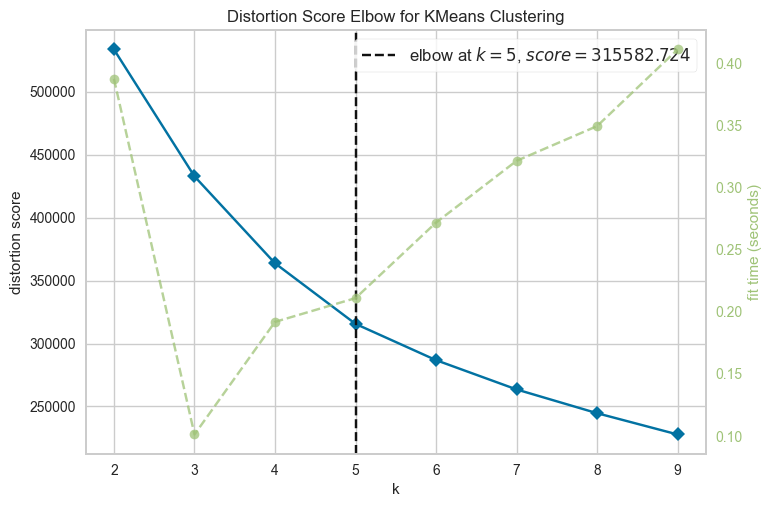

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [7]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,10))
pca_sample = df_pca.sample(n=30000, random_state = 1)
visualizer.fit(pca_sample)
visualizer.poof()

After we get these result of 5 clusters using the two methods let´s see if we get different results using the k_means to all of the 50 features.
Again we will use a 30.000 sample.


C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\André Torres\App

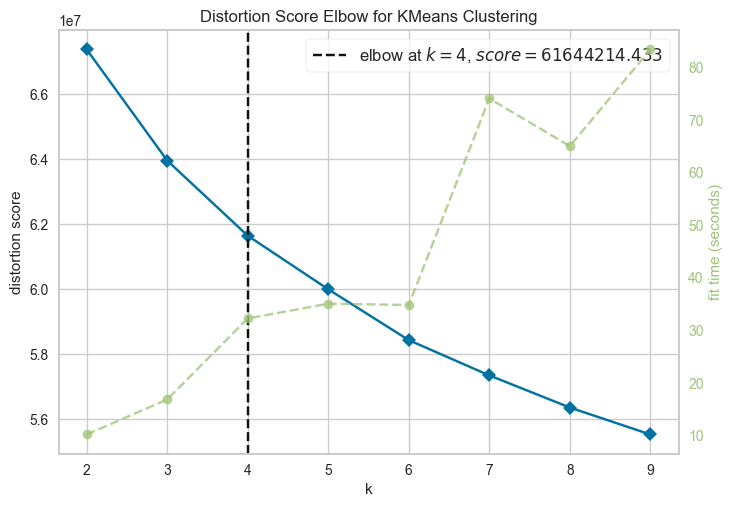

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [8]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,10))
features_sample_1= features.sample(n=30000, random_state = 1)
visualizer.fit(features)
visualizer.poof()

INSIGHT - we can see that we´ve got different results.
Using PCA we got 5 clusters and using directly the K-means we got 4.

In these case and because we have 5 major features, we will use these mesure. 

C:\Users\André Torres\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



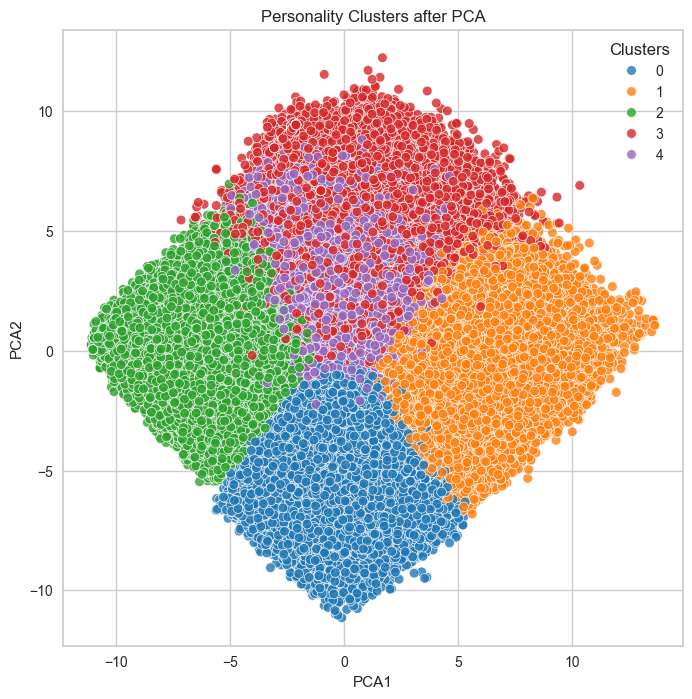

In [11]:
# In order to visualize in 2D graph will use PCA

kmeans = KMeans(n_clusters=5)
k_fit = kmeans.fit(features)
predictions = k_fit.labels_
features['Clusters'] = predictions


pca = PCA(n_components=2)
pca_fit = pca.fit_transform(features)

df_pca_1 = pd.DataFrame(data=pca_fit, columns=['PCA1', 'PCA2'])
df_pca_1['Clusters'] = predictions

plt.figure(figsize=(8,8))
sns.scatterplot(data=df_pca_1, x='PCA1', y='PCA2', hue='Clusters', palette='tab10', alpha=0.8)
plt.title('Personality Clusters after PCA');

We can see clearly 3 well defined clusters, but cluster 3 and 4 are overplotting, but we also see that cluster 4 it´s more centered.

After applying the k-Means defined of 5 clusters to all of the data, and categorized them and also get some visualization.

In [12]:
#how many persons and also the percentage of in each group?

cluster_counts = features['Clusters'].value_counts()
cluster_percentage = pd.DataFrame(cluster_counts/len(features)*100).astype(int)
cluster_percentage = cluster_percentage.rename(columns={'count':'Percentage'})
cluster_percentage['Count'] = cluster_counts.values
cluster_percentage


,Percentage,Count
Clusters,,
0,22,226961
4,21,213086
2,20,209175
1,19,201273
3,16,163063


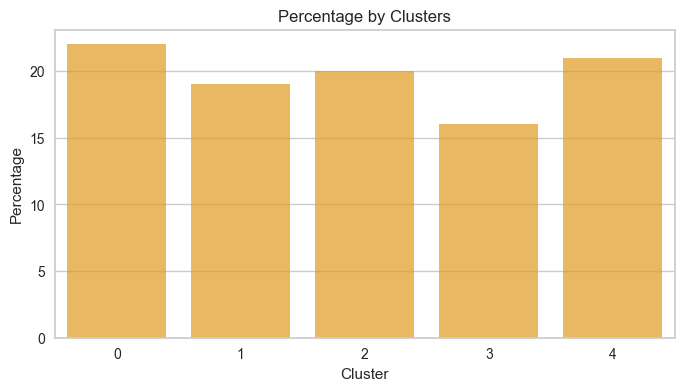

In [14]:
#the percentage of each cluster in total.

plt.figure(figsize=(8,4))
sns.barplot(x=cluster_percentage.index, y=cluster_percentage['Percentage'], color='orange', alpha= 0.7)
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.title('Percentage by Clusters')
plt.show()

Maybe let´s try to find out a pattern by calculating the mean by group of question.
Reminding that we have 10 question for each type of personality, and get some visualization of it.

In [15]:
col_list = list(features)
ext = col_list[0:10]
est = col_list[10:20]
agr = col_list[20:30]
csn = col_list[30:40]
opn = col_list[40:50]

features_sum = pd.DataFrame()
features_sum['Extroversion'] = features[ext].sum(axis = 1)/10
features_sum['Neuroticism'] = features[est].sum(axis = 1)/10
features_sum['Agreeableness'] = features[agr].sum(axis = 1)/10
features_sum['Conscientiousness'] = features[csn].sum(axis = 1)/10
features_sum['Openness'] = features[opn].sum(axis = 1)/10
features_sum['Clusters'] = predictions

features_sum.groupby('Clusters').mean()

,Extroversion,Neuroticism,Agreeableness,Conscientiousness,Openness
Clusters,,,,,
0,3.07,3.43,3.30,3.21,3.35
1,2.97,3.65,3.15,3.17,3.25
2,3.09,2.42,3.21,3.11,3.33
3,2.91,2.53,2.85,2.91,3.12
4,3.05,2.98,3.19,3.16,3.24


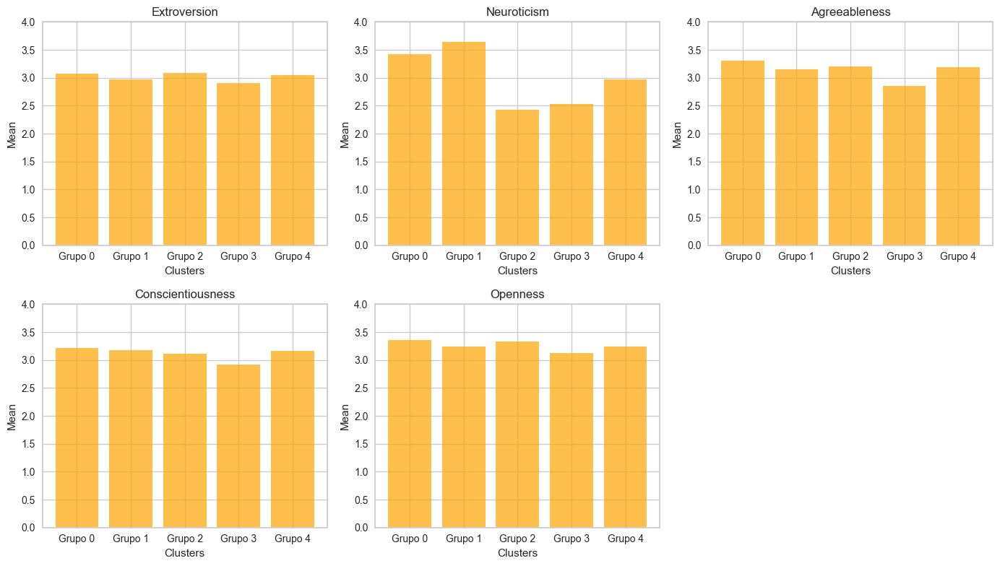

In [16]:
plt.figure(figsize=(14, 8))

for i, column in enumerate(features_sum.columns[:-1]):  # Excluímos a coluna 'Clusters'
    plt.subplot(2, 3, i + 1)
    
    for j in range(5):  # Para cada grupo
        plt.bar(j, features_sum.loc[features_sum['Clusters'] == j, column].mean(), color='orange', alpha=0.7)
    
    plt.title(column)
    plt.xlabel('Clusters')
    plt.ylabel('Mean')
    plt.xticks(range(5), [f'Grupo {k}' for k in range(5)])
    plt.ylim(0, 4)

plt.tight_layout()
plt.show()

APP TO INSERT NEW DATA.

In [17]:
#noreate our data to input new ansewrs

features[:0].to_excel('Questions.xlsx', index=False)
dicio_questions = open('questions.txt').read().split('\n')
questions = []
for q in dicio_questions:
  q = str(q)
  questions.append(q[q.find("\t"):].lstrip())
  
with open('questions.txt', 'r') as file:
  dicio_questions = [line.strip() for line in file.readlines() if line.strip()]

inputs_questions = [gr.Slider(minimum=1, maximum=5, step=1, label=q) for q in dicio_questions]

In [18]:
def predict(*outputs_questions):
  outputs_questions=np.array(outputs_questions).reshape(1, -1)
  predictions = k_fit.predict(outputs_questions)

  results_df = pd.DataFrame({'Predictions': predictions})

  results_df.to_excel('output_predictions.xlsx', index=False)

  return k_fit.predict(outputs_questions)

iface=gr.Interface(
    fn = predict,
    title = "OCEAN Personality Test",
    description = " Test you personality",
    inputs = inputs_questions,
    outputs= 'text')
    

iface.launch(share=True)

Running on local URL:  http://127.0.0.1:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.
